# Evaluations &  Visualizations 

In [57]:
import os
import numpy as np
import random
import matplotlib.pyplot as plt
from glob import glob
import time
import pydicom
from skimage.transform import resize
from skimage.metrics import structural_similarity as ssim, peak_signal_noise_ratio
from scipy.ndimage import sobel
import cv2
import gc
from tqdm import tqdm
import torch.nn.functional as F
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
import matplotlib.patches as patches



In [58]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print("Using:", device)


Using: cuda


In [25]:
from models import ResidualInterpCNN, SRGAN_G, FastDDPM, ddim_sample


In [26]:
cur_dir=(os.getcwd())
print(cur_dir)

/blue/eel6935/shreevar.venkatr/Project1


In [7]:
Dataset_path = "/blue/eel6935/shreevar.venkatr/Project1/T2_cleaned_dataset"
IMG_SIZE = 256
PATCH = 128
device = "cuda" if torch.cuda.is_available() else "cpu"


In [8]:
def is_t2(name):
    name = name.lower()
    return ("t2" in name) and ("ax" in name or "axial" in name or "spc" in name)


In [9]:
def load_dicom_series(series_path):
    dcm_files = sorted([
        os.path.join(series_path, f)
        for f in os.listdir(series_path) if f.endswith(".dcm")
    ])

    if len(dcm_files) < 5:
        return None

    slices = [pydicom.dcmread(f) for f in dcm_files]
    slices.sort(key=lambda x: float(x.InstanceNumber))

    vol = np.stack([s.pixel_array for s in slices], axis=-1).astype(np.float32)

    # Resize each slice to 256×256
    vol_resized = np.zeros((IMG_SIZE, IMG_SIZE, vol.shape[-1]), np.float32)
    for i in range(vol.shape[-1]):
        vol_resized[:, :, i] = resize(vol[:, :, i], (IMG_SIZE, IMG_SIZE), preserve_range=True)

    return vol_resized


In [10]:
series_by_patient = {}

for patient in sorted(os.listdir(Dataset_path)):
    p_dir = os.path.join(Dataset_path, patient)
    if not os.path.isdir(p_dir):
        continue

    t2s = []
    for s in os.listdir(p_dir):
        if is_t2(s):
            t2s.append(os.path.join(p_dir, s))

    if len(t2s) > 0:
        series_by_patient[patient] = t2s

all_patients = sorted(series_by_patient.keys())
print("Total patients with T2:", len(all_patients))


Total patients with T2: 837


In [11]:



from sklearn.model_selection import train_test_split

# 1. Get list of all patients
all_patients = sorted(series_by_patient.keys())

# 2. 70% train, 30% temp
train_patients, temp_patients = train_test_split(
    all_patients, test_size=0.30, shuffle=True, random_state=42
)

# 3. Split temp into 15% val and 15% test
val_patients, test_patients = train_test_split(
    temp_patients, test_size=0.50, shuffle=True, random_state=42
)

print("Train patients:", len(train_patients))
print("Val patients:", len(val_patients))
print("Test patients:", len(test_patients))

# 4. Expand to actual DICOM series paths
train_series = sum([series_by_patient[p] for p in train_patients], [])
val_series   = sum([series_by_patient[p] for p in val_patients], [])
test_series  = sum([series_by_patient[p] for p in test_patients], [])

print("Train series:", len(train_series))
print("Val series:", len(val_series))
print("Test series:", len(test_series))



Train patients: 585
Val patients: 126
Test patients: 126
Train series: 712
Val series: 149
Test series: 149


In [12]:
cache = torch.load("test_dataset_cache.pt")

class CachedTestDataset(torch.utils.data.Dataset):
    def __init__(self, items):
        self.items = items

    def __len__(self):
        return len(self.items)

    def __getitem__(self, idx):
        d = self.items[idx]
        return d["prev"], d["next"], d["mid"]

cached_test_dataset = CachedTestDataset(cache)
cached_test_loader = DataLoader(cached_test_dataset, batch_size=4, shuffle=False)


In [69]:
cnn = ResidualInterpCNN().to(device)
cnn.load_state_dict(torch.load(cur_dir+ "/models/best_model.pth"))
cnn.eval()


ResidualInterpCNN(
  (entry): Sequential(
    (0): Conv2d(2, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
  )
  (res): Sequential(
    (0): ResidualBlock(
      (b): Sequential(
        (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): ReLU(inplace=True)
        (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      )
    )
    (1): ResidualBlock(
      (b): Sequential(
        (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): ReLU(inplace=True)
        (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      )
    )
    (2): ResidualBlock(
      (b): Sequential(
        (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): ReLU(inplace=True)
        (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      )
    )
    (3): ResidualBlock(
      (b): Sequential(
        (0): Conv2d(64, 64, ker

In [70]:
srgan = SRGAN_G().to(device)
srgan.load_state_dict(torch.load(cur_dir+ "/models/best_G.pth"))
srgan.eval()

SRGAN_G(
  (pre): Sequential(
    (0): Conv2d(2, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
  )
  (res): Sequential(
    (0): ResBlock(
      (block): Sequential(
        (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): ReLU(inplace=True)
        (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      )
    )
    (1): ResBlock(
      (block): Sequential(
        (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): ReLU(inplace=True)
        (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      )
    )
    (2): ResBlock(
      (block): Sequential(
        (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): ReLU(inplace=True)
        (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      )
    )
    (3): ResBlock(
      (block): Sequential(
        (0): Conv2d(64, 64, kernel_size=(3, 3),

In [71]:


ddpm = FastDDPM(device=device, T=10).to(device)
ddpm.load_state_dict(torch.load(cur_dir+ "/models/fastddpm_best.pth"))
ddpm.eval()



FastDDPM(
  (unet): UNet2D(
    (time_mlp): Sequential(
      (0): Linear(in_features=256, out_features=256, bias=True)
      (1): ReLU(inplace=True)
      (2): Linear(in_features=256, out_features=256, bias=True)
    )
    (inc): DoubleConv(
      (block): Sequential(
        (0): Conv2d(259, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): ReLU(inplace=True)
        (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (3): ReLU(inplace=True)
      )
    )
    (down1): DoubleConv(
      (block): Sequential(
        (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): ReLU(inplace=True)
        (2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (3): ReLU(inplace=True)
      )
    )
    (down2): DoubleConv(
      (block): Sequential(
        (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): ReLU(inplace=True)
        (2): Conv2d(256, 256, kernel_

# Evaluation of all the models 

In [73]:

#PSNR/MAE 
def compute_metrics(gt, pred):
    gt = gt.astype(np.float32)
    pred = pred.astype(np.float32)

    return (
        np.mean((pred - gt)**2),# MSE
        np.mean(np.abs(pred - gt)),# MAE
        peak_signal_noise_ratio(gt, pred, data_range=2),
        ssim(gt, pred, data_range=2)
    )


In [37]:




# # Predict the models
# @torch.no_grad()
# def run_model(model_name, prev, nxt, device):
#     prev = prev.to(device)
#     nxt  = nxt.to(device)

#     start = time.time()

#     if model_name == "cnn":
#         pred = cnn(torch.cat([prev, nxt], dim=1))

#     elif model_name == "srgan":
#         pred = srgan(prev, nxt)

#     elif model_name == "ddpm":
#         pred = ddim_sample(ddpm, prev, nxt, device)

#     infer_time = time.time() - start

#     return pred, infer_time


# # Evaluation
# @torch.no_grad()
# def evaluate_all_models(cnn, srgan, ddpm, loader, device):

#     results = {
#         "ResidualInterpCNN":  {"mse": [], "mae": [], "psnr": [], "ssim": [], "time": []},
#         "srgan":{"mse": [], "mae": [], "psnr": [], "ssim": [], "time": []},
#         "Fast-DDPM": {"mse": [], "mae": [], "psnr": [], "ssim": [], "time": []},
#     }

#     for prev, nxt, mid in loader:

#         prev = prev.to(device)
#         nxt  = nxt.to(device)
#         mid  = mid.to(device)

#         gt_np = mid[0,0].cpu().numpy()

#         # ---------- CNN ----------
#         pred, t = run_model("cnn", prev, nxt, device)
#         pred_np = pred[0,0].cpu().numpy()
#         mse, mae, ps, ss = compute_metrics(gt_np, pred_np)
#         results["ResidualInterpCNN"]["mse"].append(mse)
#         results["ResidualInterpCNN"]["mae"].append(mae)
#         results["ResidualInterpCNN"]["psnr"].append(ps)
#         results["ResidualInterpCNN"]["ssim"].append(ss)
#         results["ResidualInterpCNN"]["time"].append(t)

#         # ---------- SRGAN ----------
#         pred, t = run_model("srgan", prev, nxt, device)
#         pred_np = pred[0,0].cpu().numpy()
#         mse, mae, ps, ss = compute_metrics(gt_np, pred_np)
#         results["srgan"]["mse"].append(mse)
#         results["srgan"]["mae"].append(mae)
#         results["srgan"]["psnr"].append(ps)
#         results["srgan"]["ssim"].append(ss)
#         results["srgan"]["time"].append(t)

#         # ---------- DDPM ----------
#         pred, t = run_model("ddpm", prev, nxt, device)
#         pred_np = pred[0,0].cpu().numpy()
#         mse, mae, ps, ss = compute_metrics(gt_np, pred_np)
#         results["Fast-DDPM"]["mse"].append(mse)
#         results["Fast-DDPM"]["mae"].append(mae)
#         results["Fast-DDPM"]["psnr"].append(ps)
#         results["Fast-DDPM"]["ssim"].append(ss)
#         results["Fast-DDPM"]["time"].append(t)

#     # ---------- PRINT RESULTS ----------
#     for name in ["ResidualInterpCNN", "srgan", "Fast-DDPM"]:
#         print(f"\n{name.upper()} RESULTS:")
#         print(f"MSE  : {np.mean(results[name]['mse']):.6f}")
#         print(f"MAE  : {np.mean(results[name]['mae']):.6f}")
#         print(f"PSNR : {np.mean(results[name]['psnr']):.3f}")
#         print(f"SSIM : {np.mean(results[name]['ssim']):.3f}")
#         print(f"Inference Time (s): {np.mean(results[name]['time']):.6f}")
        



In [38]:
results = evaluate_all_models(cnn, srgan, ddpm, cached_test_loader, device)



RESIDUALINTERPCNN RESULTS:
MSE  : 0.006338
MAE  : 0.055743
PSNR : 29.027
SSIM : 0.843
Inference Time (s): 0.000443

SRGAN RESULTS:
MSE  : 0.006300
MAE  : 0.055723
PSNR : 29.045
SSIM : 0.850
Inference Time (s): 0.000608

FAST-DDPM RESULTS:
MSE  : 0.009355
MAE  : 0.069518
PSNR : 27.019
SSIM : 0.801
Inference Time (s): 0.010499


In [62]:

results_table = pd.DataFrame({
    "Model": ["RESIDUALINTERPCNN", "SRGAN", "Fast-DDPM"],
    "MSE":   [0.006338, 0.006300, 0.009355],
    "MAE":   [0.055743, 0.055723, 0.069518],
    "PSNR":  [29.027, 29.045, 27.019],
    "SSIM":  [0.843, 0.850, 0.801],
    "Inference Time (s)": [0.000443, 0.000608, 0.010499]
})

results_table


,Model,MSE,MAE,PSNR,SSIM,Inference Time (s)
0,RESIDUALINTERPCNN,0.006338,0.055743,29.027,0.843,0.000443
1,SRGAN,0.006300,0.055723,29.045,0.850,0.000608
2,Fast-DDPM,0.009355,0.069518,27.019,0.801,0.010499


In [66]:
@torch.no_grad()
def evaluate_all_models(cnn, srgan, ddpm, loader, device):

    results = {
        "RESIDUALINTERPCNN":  {"mse": [], "mae": [], "psnr": [], "ssim": [], "time": []},
        "SRGAN":              {"mse": [], "mae": [], "psnr": [], "ssim": [], "time": []},
        "Fast-DDPM":          {"mse": [], "mae": [], "psnr": [], "ssim": [], "time": []},
    }

    for prev, nxt, mid in loader:

        prev = prev.to(device)
        nxt  = nxt.to(device)
        mid  = mid.to(device)

        gt_np = mid[0,0].cpu().numpy()

        # ---------- CNN ----------
        pred, t = run_model("cnn", prev, nxt, device)
        pred_np = pred[0,0].cpu().numpy()
        mse, mae, ps, ss = compute_metrics(gt_np, pred_np)
        results["RESIDUALINTERPCNN"]["mse"].append(mse)
        results["RESIDUALINTERPCNN"]["mae"].append(mae)
        results["RESIDUALINTERPCNN"]["psnr"].append(ps)
        results["RESIDUALINTERPCNN"]["ssim"].append(ss)
        results["RESIDUALINTERPCNN"]["time"].append(t)

        # ---------- SRGAN ----------
        pred, t = run_model("srgan", prev, nxt, device)
        pred_np = pred[0,0].cpu().numpy()
        mse, mae, ps, ss = compute_metrics(gt_np, pred_np)
        results["SRGAN"]["mse"].append(mse)
        results["SRGAN"]["mae"].append(mae)
        results["SRGAN"]["psnr"].append(ps)
        results["SRGAN"]["ssim"].append(ss)
        results["SRGAN"]["time"].append(t)

        # ---------- DDPM ----------
        pred, t = run_model("ddpm", prev, nxt, device)
        pred_np = pred[0,0].cpu().numpy()
        mse, mae, ps, ss = compute_metrics(gt_np, pred_np)
        results["Fast-DDPM"]["mse"].append(mse)
        results["Fast-DDPM"]["mae"].append(mae)
        results["Fast-DDPM"]["psnr"].append(ps)
        results["Fast-DDPM"]["ssim"].append(ss)
        results["Fast-DDPM"]["time"].append(t)

    # print summary
    for name in results.keys():
        print(f"\n{name} RESULTS:")
        print(f"MSE  : {np.mean(results[name]['mse']):.6f}")
        print(f"MAE  : {np.mean(results[name]['mae']):.6f}")
        print(f"PSNR : {np.mean(results[name]['psnr']):.3f}")
        print(f"SSIM : {np.mean(results[name]['ssim']):.3f}")
        print(f"Inference Time (s): {np.mean(results[name]['time']):.6f}")

    return results


In [74]:
results = evaluate_all_models(cnn, srgan, ddpm, cached_test_loader, device)



RESIDUALINTERPCNN RESULTS:
MSE  : 0.006338
MAE  : 0.055743
PSNR : 29.027
SSIM : 0.843
Inference Time (s): 0.000449

SRGAN RESULTS:
MSE  : 0.006300
MAE  : 0.055723
PSNR : 29.045
SSIM : 0.850
Inference Time (s): 0.000614

Fast-DDPM RESULTS:
MSE  : 0.009369
MAE  : 0.069559
PSNR : 27.014
SSIM : 0.802
Inference Time (s): 0.010469


In [77]:
import numpy as np
import pandas as pd

# Collect averaged results in a single table
results_table = pd.DataFrame({
    "Model": ["RESIDUALINTERPCNN", "SRGAN", "Fast-DDPM"],
    "MSE":   [
        np.mean(results["RESIDUALINTERPCNN"]["mse"]),
        np.mean(results["SRGAN"]["mse"]),
        np.mean(results["Fast-DDPM"]["mse"])
    ],
    "MAE":   [
        np.mean(results["RESIDUALINTERPCNN"]["mae"]),
        np.mean(results["SRGAN"]["mae"]),
        np.mean(results["Fast-DDPM"]["mae"])
    ],
    "PSNR":  [
        np.mean(results["RESIDUALINTERPCNN"]["psnr"]),
        np.mean(results["SRGAN"]["psnr"]),
        np.mean(results["Fast-DDPM"]["psnr"])
    ],
    "SSIM":  [
        np.mean(results["RESIDUALINTERPCNN"]["ssim"]),
        np.mean(results["SRGAN"]["ssim"]),
        np.mean(results["Fast-DDPM"]["ssim"])
    ],
    "Time": [
        np.mean(results["RESIDUALINTERPCNN"]["time"]),
        np.mean(results["SRGAN"]["time"]),
        np.mean(results["Fast-DDPM"]["time"])
    ],
})

results_table


,Model,MSE,MAE,PSNR,SSIM,Time
0,RESIDUALINTERPCNN,0.006338,0.055743,29.027357,0.843042,0.000449
1,SRGAN,0.006300,0.055723,29.044779,0.849764,0.000614
2,Fast-DDPM,0.009369,0.069559,27.014012,0.801726,0.010469


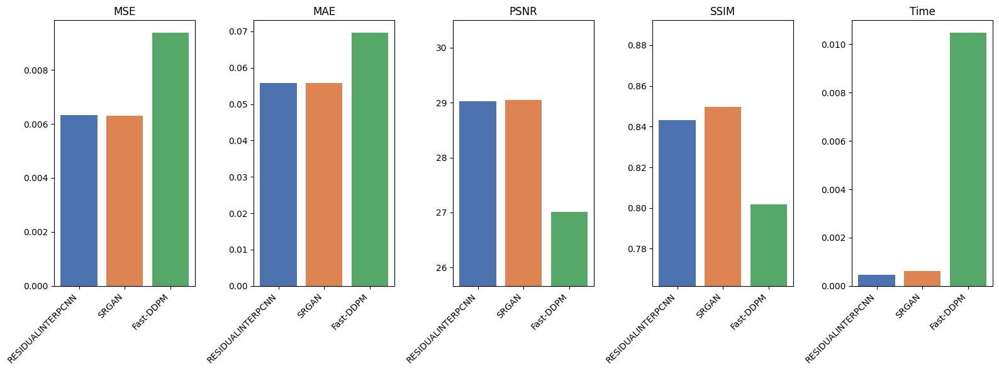

In [78]:
import matplotlib.pyplot as plt

metrics = ["MSE", "MAE", "PSNR", "SSIM", "Time"]
models = results_table["Model"]

plt.figure(figsize=(16, 6))

for i, metric in enumerate(metrics):
    plt.subplot(1, 5, i + 1)
    plt.bar(models, results_table[metric], color=["#4c72b0", "#dd8452", "#55a868"])
    plt.title(metric)
    plt.xticks(rotation=45, ha="right")
    if metric in ["PSNR", "SSIM"]:
        plt.ylim(bottom=min(results_table[metric]) * 0.95)
    else:
        plt.ylim(bottom=0)

plt.tight_layout()
plt.show()


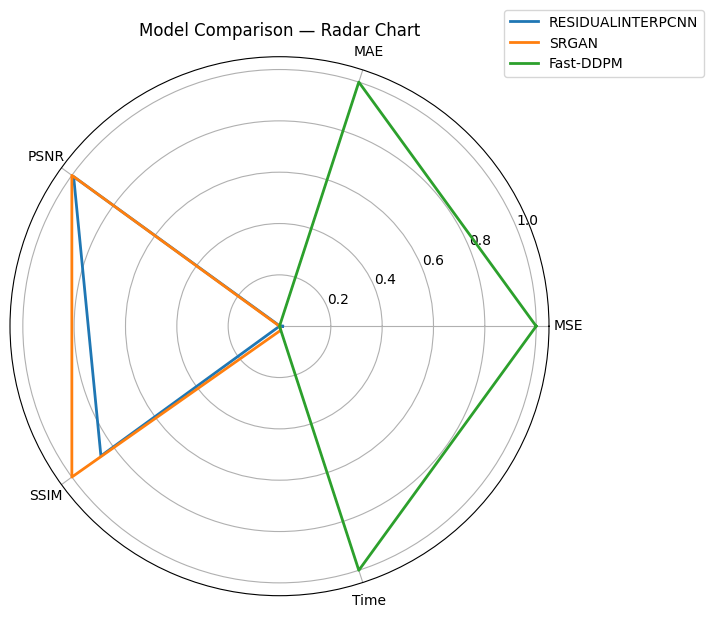

In [79]:
from math import pi

# Normalize metrics (so radar chart looks balanced)
df = results_table.copy()
df_norm = df.copy()

for col in ["MSE", "MAE", "PSNR", "SSIM", "Time"]:
    df_norm[col] = (df[col] - df[col].min()) / (df[col].max() - df[col].min())

# Radar labels
labels = ["MSE", "MAE", "PSNR", "SSIM", "Time"]
num_vars = len(labels)

angles = [n / float(num_vars) * 2 * np.pi for n in range(num_vars)]
angles += angles[:1]

plt.figure(figsize=(7, 7))

for i, model in enumerate(df_norm["Model"]):
    values = df_norm.iloc[i].drop("Model").values.flatten().tolist()
    values += values[:1]

    plt.polar(angles, values, label=model, linewidth=2)

plt.xticks(angles[:-1], labels)
plt.title("Model Comparison — Radar Chart")
plt.legend(loc="upper right", bbox_to_anchor=(1.3, 1.1))
plt.show()


# Visualizations

In [60]:


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


# Normalization

def normalize(x):
    x = x.astype(np.float32)
    x = (x - x.min()) / (x.max() - x.min() + 1e-8)
    return x * 2 - 1   # [-1,1]

def denormalize(x, ref):
    x = (x + 1) / 2     # [-1,1] → [0,1]
    return x * (ref.max() - ref.min()) + ref.min()


# Metrics

def compute_metrics(gt, pred):

    # Normalize both to [0,1]
    gt_n  = (gt - gt.min()) / (gt.max() - gt.min() + 1e-8)
    pr_n  = (pred - pred.min()) / (pred.max() - pred.min() + 1e-8)

    psnr = peak_signal_noise_ratio(gt_n, pr_n, data_range=1.0)
    ssimv = structural_similarity(gt_n, pr_n, data_range=1.0)

    return psnr, ssimv



# Zoom crop

def crop_zoom(img, cx, cy, size=32):
    return img[cy-size:cy+size, cx-size:cx+size]


In [40]:
@torch.no_grad()
def ddpm_interpolate(prev_np, next_np, device):
    # Normalize to [-1,1]
    p = normalize(prev_np)
    n = normalize(next_np)

    p_t = torch.tensor(p).unsqueeze(0).unsqueeze(0).to(device)
    n_t = torch.tensor(n).unsqueeze(0).unsqueeze(0).to(device)

    # DDIM sampler (already provided in your repo)
    pred_norm = ddim_sample(ddpm, p_t, n_t, device)[0,0].cpu().numpy()

    # Back to real MRI intensities
    ref = (prev_np + next_np) / 2
    return denormalize(pred_norm, ref)


In [41]:
@torch.no_grad()
def infer_cnn(prev_np, next_np):
    prev_t = torch.tensor(prev_np).unsqueeze(0).unsqueeze(0).float().to(device)
    next_t = torch.tensor(next_np).unsqueeze(0).unsqueeze(0).float().to(device)
    return cnn(torch.cat([prev_t, next_t], dim=1))[0,0].cpu().numpy()


@torch.no_grad()
def infer_srgan(prev_np, next_np):
    prev_t = torch.tensor(prev_np).unsqueeze(0).unsqueeze(0).float().to(device)
    next_t = torch.tensor(next_np).unsqueeze(0).unsqueeze(0).float().to(device)
    return srgan(prev_t, next_t)[0,0].cpu().numpy()


In [42]:
def reconstruct_full_volume(model_name, volume):
    H, W, Z = volume.shape
    out = np.zeros((H, W, 2*Z - 1), dtype=np.float32)

    write = 0
    
    for z in range(Z - 1):
        prev = volume[:,:,z]
        nxt  = volume[:,:,z+1]

        # original slice
        out[:,:,write] = prev
        write += 1

        # SR-generated middle slice
        if model_name == "cnn":
            mid = infer_cnn(prev, nxt)
        elif model_name == "srgan":
            mid = infer_srgan(prev, nxt)
        elif model_name == "ddpm":
            mid = ddpm_interpolate(prev, nxt, device)

        out[:,:,write] = mid
        write += 1

    # last slice
    out[:,:,write] = volume[:,:,-1]
    return out


In [43]:
def sagittal(vol):
    mid = vol.shape[1] // 2
    return vol[:, mid, :]


In [59]:
def save_full_sagittal(idx, patient_vol):

    sag_lr = sagittal(patient_vol)
    sag_cnn  = sagittal(reconstruct_full_volume("cnn", patient_vol))
    sag_gan  = sagittal(reconstruct_full_volume("srgan", patient_vol))
    sag_ddpm = sagittal(reconstruct_full_volume("ddpm", patient_vol))

    cx = sag_lr.shape[1] // 2
    cy = sag_lr.shape[0] // 2



    fig, ax = plt.subplots(2, 4, figsize=(22, 12))
    fig.suptitle(f"Full 3D Sagittal Comparison: Example {idx}", fontsize=22, weight="bold")

    titles = ["GT Sagittal", "RESIDUALINTERP CNN SR", "SRGAN SR", "FastDDPM SR"]
    imgs   = [sag_lr, sag_cnn, sag_gan, sag_ddpm]

    for i in range(4):
        ax[1,i].axis("off")

        ax[0,i].imshow(imgs[i], cmap='gray')
        ax[0,i].set_title(titles[i])
        ax[0,i].axis("off")
        rect = patches.Rectangle((cx-32, cy-32), 64, 64, linewidth=2, edgecolor='red', facecolor='none')
        ax[0,i].add_patch(rect)
        ax[0,i].axis("off")


    plt.tight_layout()
    plt.savefig(f"results/full_sagittal_comparison_{idx}.png", dpi=300)
    plt.show()


In [45]:
def save_full_axial(idx, patient_vol, slice_index=None):

    if slice_index is None:
        slice_index = patient_vol.shape[2] // 2

    H, W, Z = patient_vol.shape
    
    prev_np = patient_vol[:,:,slice_index - 1]
    mid_np  = patient_vol[:,:,slice_index]
    next_np = patient_vol[:,:,slice_index + 1]

    pred_cnn   = infer_cnn(prev_np, next_np)
    pred_srgan = infer_srgan(prev_np, next_np)
    pred_ddpm  = ddpm_interpolate(prev_np, next_np, device)

    ps_cnn, ss_cnn = compute_metrics(mid_np, pred_cnn)
    ps_gan, ss_gan = compute_metrics(mid_np, pred_srgan)
    ps_ddp, ss_ddp = compute_metrics(mid_np, pred_ddpm)

    cx, cy = W//2, H//2

    zoom_gt   = crop_zoom(mid_np, cx, cy)
    zoom_cnn  = crop_zoom(pred_cnn, cx, cy)
    zoom_gan  = crop_zoom(pred_srgan, cx, cy)
    zoom_ddp  = crop_zoom(pred_ddpm, cx, cy)

    fig, ax = plt.subplots(3, 4, figsize=(22, 14))
    fig.suptitle(f"Full 3D Axial Comparison: Example {idx}", fontsize=22, weight="bold")

    # row 1
    ax[0,0].imshow(prev_np, cmap='gray'); ax[0,0].set_title("Prev slice")
    ax[0,1].imshow(mid_np,  cmap='gray'); ax[0,1].set_title("current GT slice")
    ax[0,2].imshow(next_np, cmap='gray'); ax[0,2].set_title("Next slice")
    ax[0,3].axis("off")

    rect = patches.Rectangle((cx-32, cy-32), 64, 64, linewidth=2, edgecolor="red", facecolor="none")
    ax[0,1].add_patch(rect)

    # row 2
    ax[1,0].imshow(pred_cnn, cmap='gray'); ax[1,0].set_title(f"RESIDUALINTER PCNN\nPSNR={ps_cnn:.2f}, SSIM={ss_cnn:.3f}")
    ax[1,1].imshow(pred_srgan, cmap='gray'); ax[1,1].set_title(f"SRGAN\nPSNR={ps_gan:.2f}, SSIM={ss_gan:.3f}")
    ax[1,2].imshow(pred_ddpm, cmap='gray'); ax[1,2].set_title(f"Fast-DDPM\nPSNR={ps_ddp:.2f}, SSIM={ss_ddp:.3f}")
    ax[1,3].axis("off")

    # row 3 — zoom
    ax[2,0].imshow(zoom_cnn, cmap='gray');  ax[2,0].set_title("Zoom CNN")
    ax[2,1].imshow(zoom_gan, cmap='gray');  ax[2,1].set_title("Zoom SRGAN")
    ax[2,2].imshow(zoom_ddp, cmap='gray');  ax[2,2].set_title("Zoom DDPM")


    for a in ax.flatten(): a.axis("off")
    plt.tight_layout()
    plt.savefig(f"results/full_axial_comparison_{idx}.png", dpi=300)
    plt.show()


In [46]:
def compute_metrics(gt, pred):

    # Normalize both to [0,1]
    gt_n  = (gt - gt.min()) / (gt.max() - gt.min() + 1e-8)
    pr_n  = (pred - pred.min()) / (pred.max() - pred.min() + 1e-8)

    psnr = peak_signal_noise_ratio(gt_n, pr_n, data_range=1.0)
    ssimv = structural_similarity(gt_n, pr_n, data_range=1.0)

    return psnr, ssimv


In [47]:
# def normalize(x):
#     return (x - x.min()) / (x.max() - x.min() + 1e-8)


import os
os.makedirs("results/slice_analysis", exist_ok=True)

def visualize_one(gt, pred, model_title, z_index):
    
    # ---- NORMALIZED IMAGES FOR VISUALIZATION ----
    gt_n = normalize(gt)
    pr_n = normalize(pred)

    # ---- METRICS (Option B: consistent normalization) ----
    ps, ss = compute_metrics(gt, pred)

    # ---- SSIM MAP ----
    _, ssim_map = ssim(gt_n, pr_n, data_range=1.0, full=True, win_size=3)

    # ---- ERROR / EDGES ----
    err = np.abs(gt_n - pr_n)
    gt_e = sobel(gt_n)
    pr_e = sobel(pr_n)
    ediff = np.abs(gt_e - pr_e)

    # ---- FIGURE ----
    fig, ax = plt.subplots(2, 4, figsize=(20, 10))
    fig.suptitle(f"{model_title} :PSNR={ps:.2f}, SSIM={ss:.3f}", 
                 fontsize=18, weight="bold")

    # Row 1
    ax[0,0].imshow(gt_n, cmap='gray'); ax[0,0].set_title("Ground Truth"); ax[0,0].axis("off")
    ax[0,1].imshow(pr_n, cmap='gray'); ax[0,1].set_title("Prediction");   ax[0,1].axis("off")

    im = ax[0,2].imshow(err, cmap='magma')
    ax[0,2].set_title("Error Heatmap"); ax[0,2].axis("off")
    plt.colorbar(im, ax=ax[0,2], fraction=0.046)

    im = ax[0,3].imshow(ssim_map, cmap='viridis')
    ax[0,3].set_title("SSIM Map"); ax[0,3].axis("off")
    plt.colorbar(im, ax=ax[0,3], fraction=0.046)

    # Row 2
    ax[1,0].imshow(gt_e, cmap="gray"); ax[1,0].set_title("GT Edges"); ax[1,0].axis("off")
    ax[1,1].imshow(pr_e, cmap="gray"); ax[1,1].set_title("Pred Edges"); ax[1,1].axis("off")

    im = ax[1,2].imshow(ediff, cmap="inferno")
    ax[1,2].set_title("Edge Difference"); ax[1,2].axis("off")
    plt.colorbar(im, ax=ax[1,2], fraction=0.046)

    # Histogram
    ax[1,3].hist(gt_n.flatten(), bins=50, alpha=0.5, label="GT")
    ax[1,3].hist(pr_n.flatten(), bins=50, alpha=0.5, label="Pred")
    ax[1,3].legend()
    ax[1,3].set_title("Intensity Histogram")

    plt.tight_layout()
    
    # ---------- SAVE THE FIGURE ----------
    save_path = f"results/slice_analysis/{model_title}_slice_z_{z_index}.png"
    plt.savefig(save_path, dpi=300)
    print(f"[Saved] {save_path}")

    plt.show()


In [48]:
def save_combined_comparison(gt, pred_cnn, pred_srgan, pred_ddpm, z_index):

    gt_n = normalize(gt)

    preds = {
        "CNN": normalize(pred_cnn),
        "SRGAN": normalize(pred_srgan),
        "FastDDPM": normalize(pred_ddpm),
    }

    fig, ax = plt.subplots(1, 4, figsize=(22, 6))
    fig.suptitle(f"All Models ", fontsize=22, weight="bold")

    imgs = [gt_n, preds["CNN"], preds["SRGAN"], preds["FastDDPM"]]
    titles = ["Ground Truth", "RESIDUALINTERP CNN", "SRGAN", "FastDDPM"]

    for i in range(4):
        ax[i].imshow(imgs[i], cmap='gray')
        ax[i].set_title(titles[i])
        ax[i].axis("off")

    plt.tight_layout()

    save_path = f"results/slice_analysis/ALL_MODELS.png"
    plt.savefig(save_path, dpi=300)
    print(f"[Saved] {save_path}")

    plt.show()


In [49]:
@torch.no_grad()
def predict_slice(model_name, prev, nxt):

    if model_name == "ddpm":
        # ddpm_interpolate already returns numpy 2D slice
        return ddpm_interpolate(prev, nxt, device)

    # CNN / SRGAN (Torch models)
    prev_t = torch.FloatTensor(prev).unsqueeze(0).unsqueeze(0).to(device)
    nxt_t  = torch.FloatTensor(nxt ).unsqueeze(0).unsqueeze(0).to(device)

    if model_name == "cnn":
        out = cnn(torch.cat([prev_t, nxt_t], 1))

    elif model_name == "srgan":
        out = srgan(prev_t, nxt_t)

    # Convert tensor → numpy
    return out[0,0].detach().cpu().numpy()


In [50]:
def visualize_all_models(volume, z):

    prev = volume[:,:,z-1].astype(np.float32)
    gt   = volume[:,:,z  ].astype(np.float32)
    nxt  = volume[:,:,z+1].astype(np.float32)

    # Get predictions
    pred_cnn   = predict_slice("cnn",   prev, nxt)
    pred_srgan = predict_slice("srgan", prev, nxt)
    pred_ddpm  = predict_slice("ddpm",  prev, nxt)

    # Save + Show
    visualize_one(gt, pred_cnn,   "CNN",      z)
    visualize_one(gt, pred_srgan, "SRGAN",    z)
    visualize_one(gt, pred_ddpm,  "FastDDPM", z)

    # save combined comparison too
    save_combined_comparison(gt, pred_cnn, pred_srgan, pred_ddpm, z)


Using: /blue/eel6935/shreevar.venkatr/Project1/T2_cleaned_dataset/Prostate-MRI-US-Biopsy-0432/5.000000-t2spcrstaxial oblProstate-90932
Loaded volume shape: (256, 256, 60)


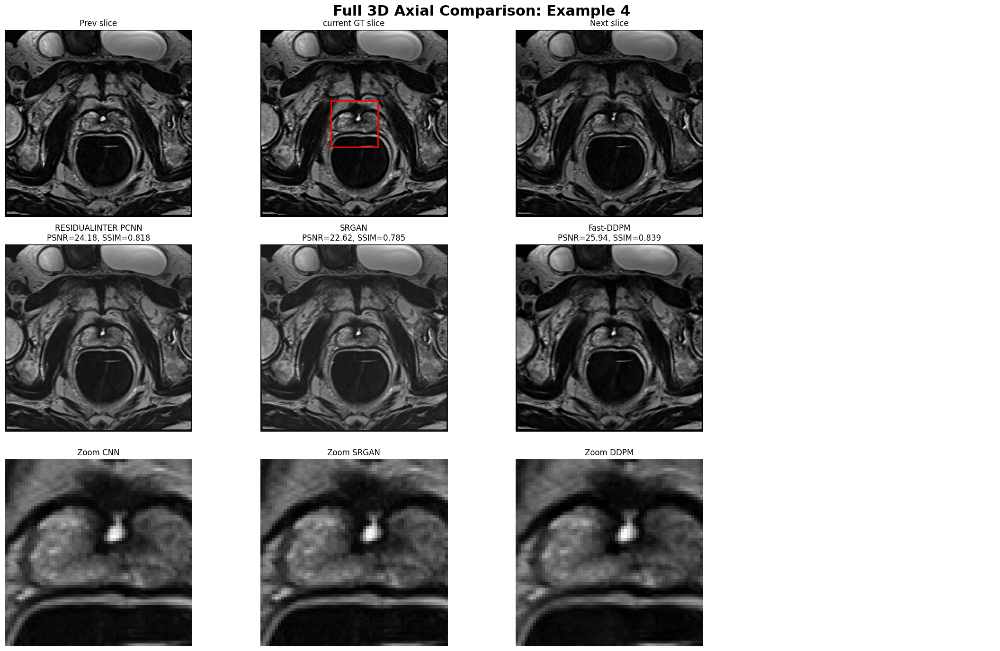

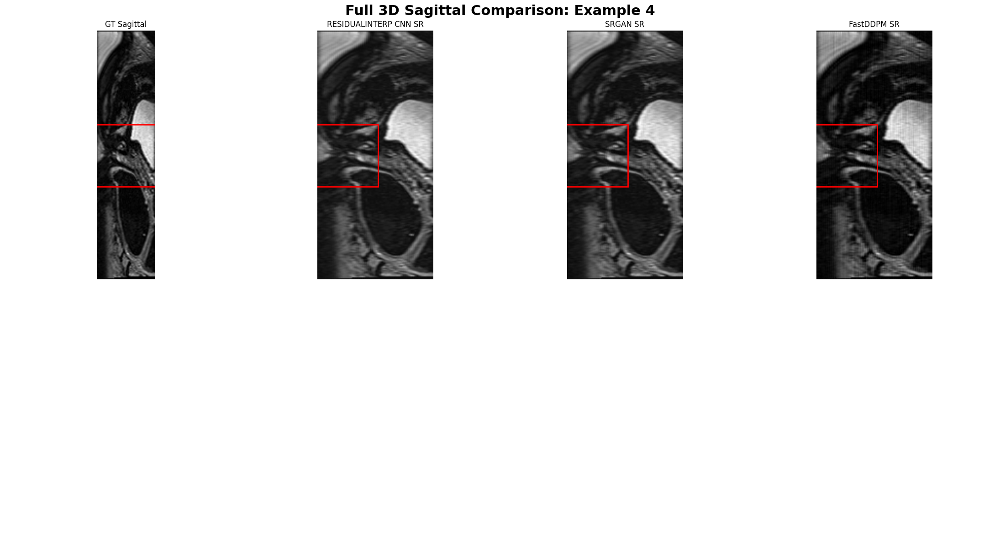

In [51]:
idx = 4   # any test index you want

series_path = test_series[idx]
print("Using:", series_path)

patient_vol = load_dicom_series(series_path)
print("Loaded volume shape:", patient_vol.shape)


save_full_axial(idx, patient_vol)
save_full_sagittal(idx, patient_vol)




[Saved] results/slice_analysis/CNN_slice_z_50.png


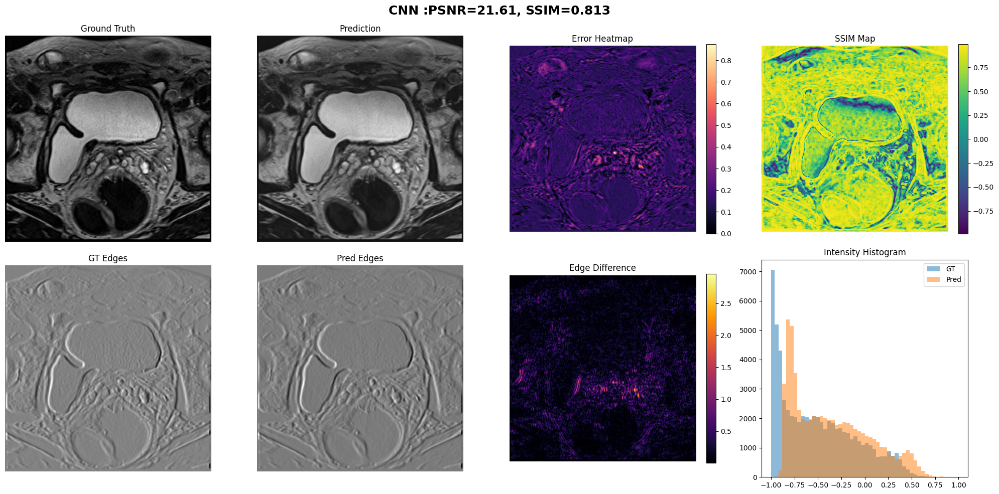

[Saved] results/slice_analysis/SRGAN_slice_z_50.png


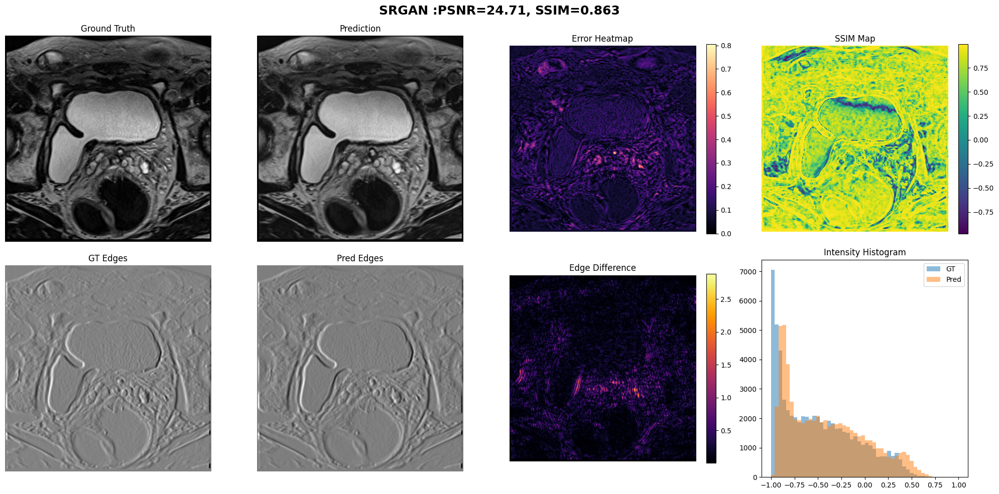

[Saved] results/slice_analysis/FastDDPM_slice_z_50.png


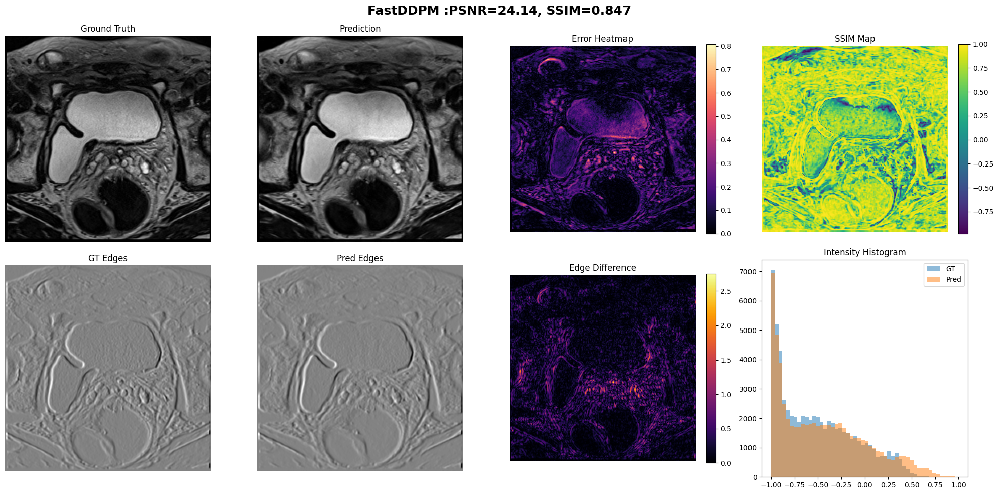

[Saved] results/slice_analysis/ALL_MODELS.png


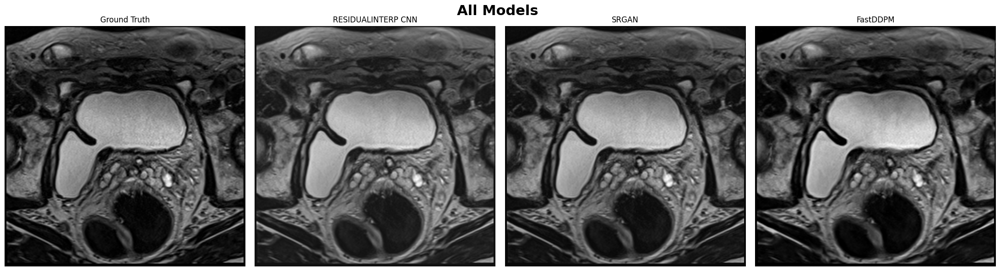

In [217]:
visualize_all_models(patient_vol, z=50)

Using: /blue/eel6935/shreevar.venkatr/Project1/T2_cleaned_dataset/Prostate-MRI-US-Biopsy-0454/7.000000-t2spcrstaxial oblProstate-21277
Loaded volume shape: (256, 256, 60)


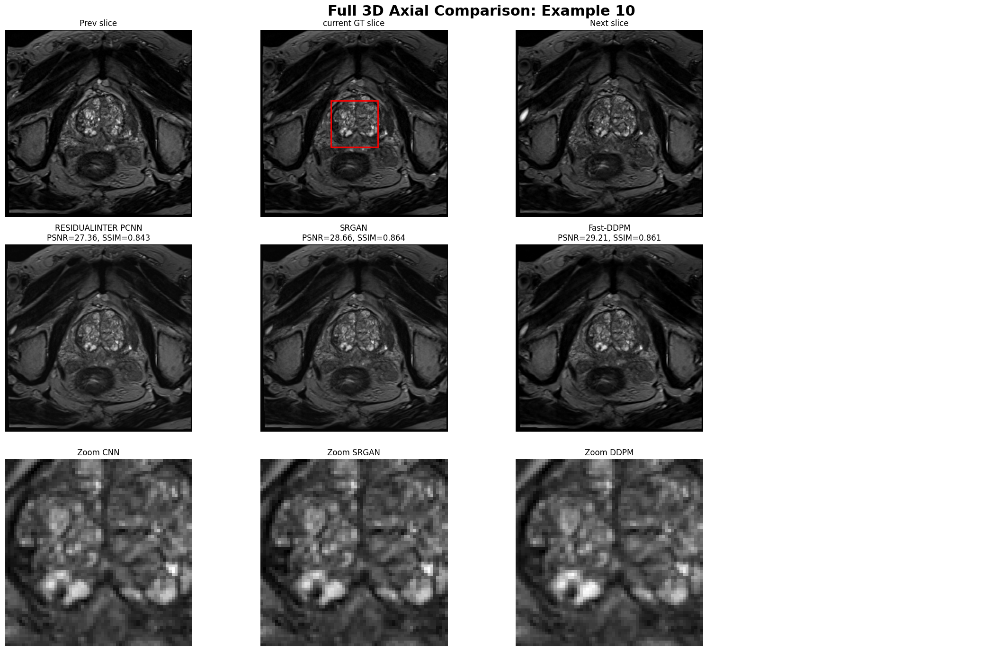

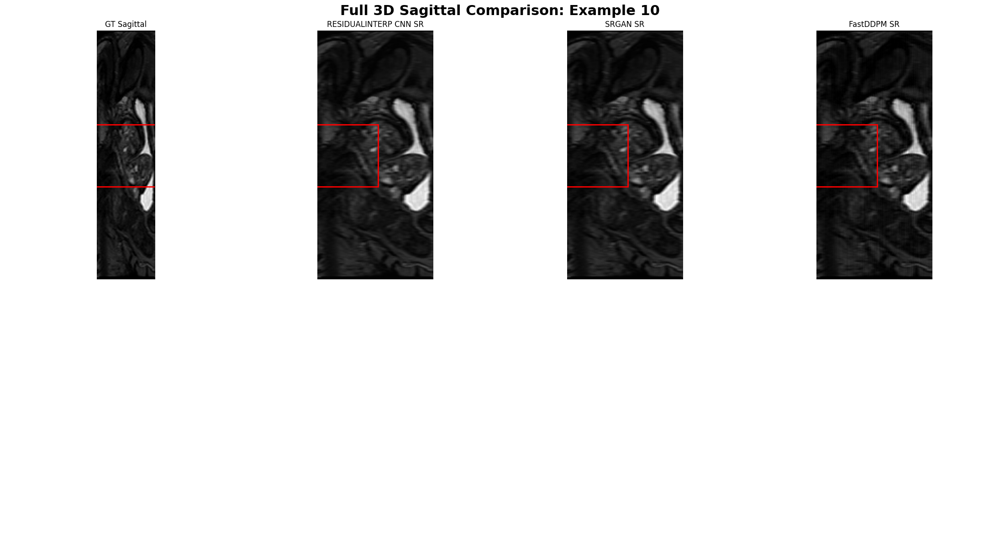

In [52]:
idx = 10   # any test index you want

series_path = test_series[idx]
print("Using:", series_path)

patient_vol = load_dicom_series(series_path)
print("Loaded volume shape:", patient_vol.shape)


save_full_axial(idx, patient_vol)
save_full_sagittal(idx, patient_vol)




[Saved] results/slice_analysis/CNN_slice_z_40.png


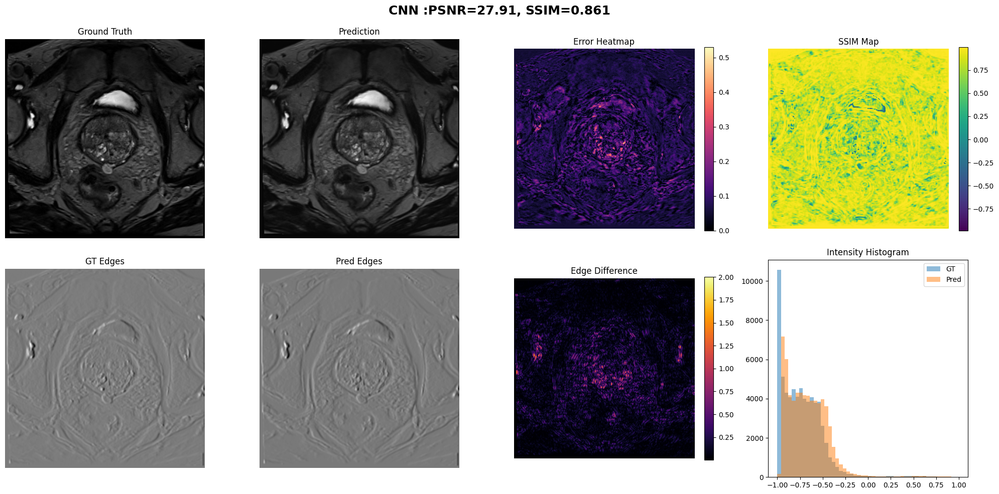

[Saved] results/slice_analysis/SRGAN_slice_z_40.png


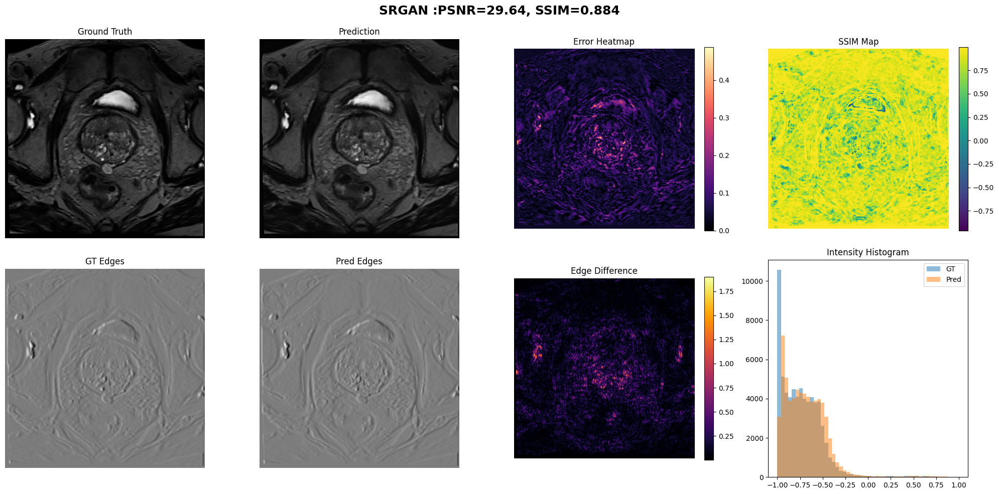

[Saved] results/slice_analysis/FastDDPM_slice_z_40.png


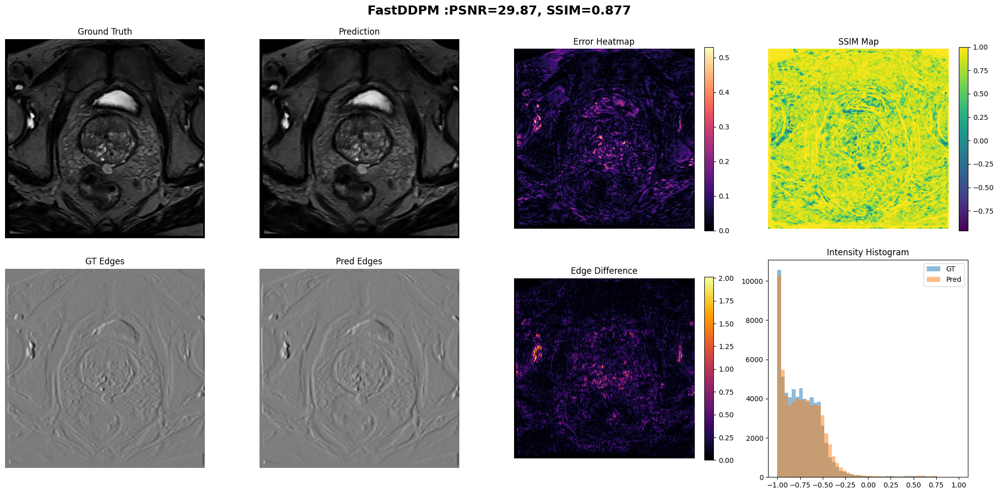

[Saved] results/slice_analysis/ALL_MODELS.png


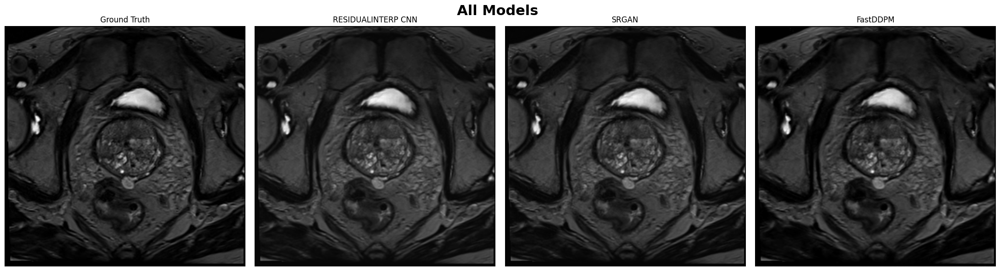

In [53]:
visualize_all_models(patient_vol, z=40)